<img src="openfood_logo.png" alt="tree" width="200"/>

# Analyse du jeu de données Open Food 
### Le nutri-score de nos aliments est-il fiable ? Qu'en est-il en cas d'absence de ce logo ?
<img src="nutriScore.png" alt="tree" width="200"/>

https://www.mangerbouger.fr/Manger-mieux/Comment-manger-mieux/Comment-comprendre-les-informations-nutritionnelles/Qu-est-ce-que-le-Nutri-Score?xtor=SEC-34-GOO-[Nutriscore]--S-[%2Bnutri-score]&gclid=Cj0KCQjwvYSEBhDjARIsAJMn0litMAytAExx_eH2Pm99AJHvKIPGAKK-gyp3svleoqb-m4XeEpGHcVoaAsFnEALw_wcB&gclsrc=aw.ds \
Pour classer chaque produit, des équipes de recherches internationales ont mis au point un score qui prend en compte,\
pour 100 grammes de produit, la teneur :
- en nutriments et aliments à favoriser : fibres, protéines, fruits et légumes
- en nutriments à limiter : énergie, acides gras saturés, sucres, sel

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

import plotly.express as px
from sklearn.decomposition import PCA

## Import

In [2]:
# import de l'échantillon
data = pd.read_csv("openfood.csv", sep="	")

C:\Users\eloif\anaconda3\envs\env_OC_project2\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


## Pre-traitement

### Repérer les individus et variables pertinents

On garde les produits vendus en **France**

In [3]:
df = data
df = df[df['countries'].notna()]

contain_FR = df['countries'].str.contains('FR')  
contain_Fr = df['countries'].str.contains('Fr')  

df = df[contain_FR | contain_Fr]
df['countries']
data_fr = df

On élimine les variables qui contiennent 70% de valeurs manquantes

In [4]:
nbr_row = data_fr.shape[0]

column_droped = data_fr.isna().sum()[data_fr.isna().sum() >= nbr_row*0.70].index
data_fr.drop(column_droped, axis=1, inplace=True)
data_fr.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'generic_name', 'quantity', 'packaging', 'packaging_tags', 'brands',
       'brands_tags', 'categories', 'categories_tags', 'categories_fr',
       'labels', 'labels_tags', 'labels_fr', 'purchase_places', 'stores',
       'countries', 'countries_tags', 'countries_fr', 'ingredients_text',
       'additives_n', 'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_fr',
       'main_category', 'main_category_fr', 'image_url', 'image_small_url',
       'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition-score-fr_100g', 'nutrition-score-uk_100g'],
      dtype='ob

Selection des variables utiles pour notre problèmatique.

In [5]:
col_bad_nutriment = ["saturated-fat_100g","energy_100g","sugars_100g","salt_100g"]
col_good_nutriment = ["fiber_100g","proteins_100g"]
col_info = ["product_name","nutrition_grade_fr"]
col_list = col_info + col_good_nutriment + col_bad_nutriment

data_fr = data_fr[col_list]

On aimerait utiliser **"fruits-vegetables-nuts_100g"** mais 94885/97851 NaN

<AxesSubplot:>

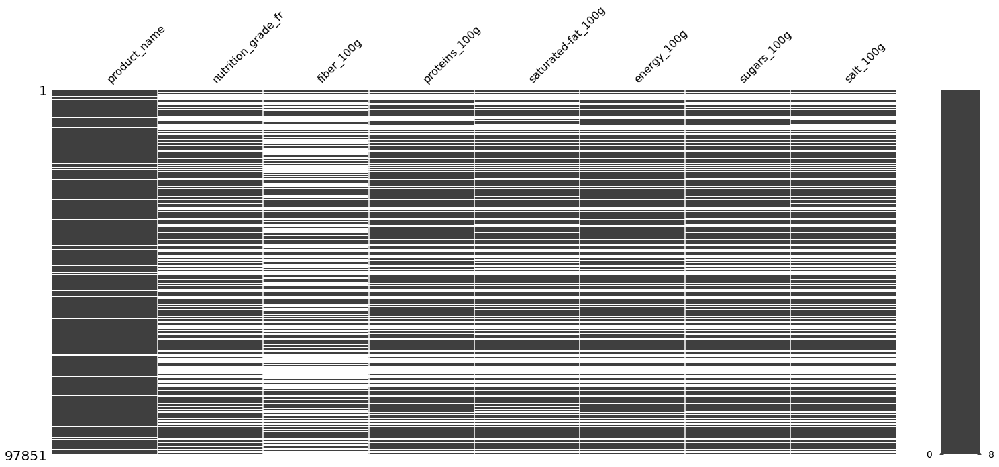

In [6]:
msno.matrix(data_fr)

**Remarque: les valeurs manquantes ont tendance à se concentrer sur les mêmes lignes/individus**\
On retire donc les individus qui présente une valeur manquante sur une des variables qui semble corrélée aux autres.

In [7]:
data_fr.dropna(subset=["saturated-fat_100g"], inplace=True)

<ipython-input-7-93699c120aef>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_fr.dropna(subset=["saturated-fat_100g"], inplace=True)


## I Presentation des données

<img src="oeil.png" alt="oeil" width="100"/>

In [8]:
nbr_row = data_fr.shape[0]
nbr_col = data_fr.shape[1]
print("nombre d'individus : "+ str(nbr_row))
print("nombre de variables : "+ str(nbr_col))
data_numerical = data_fr.select_dtypes(include=np.number)
data_categorical = data_fr.select_dtypes(exclude=np.number)
print("Dont " + str(data_numerical.shape[1]) + " numeriques")
print("Dont " + str(data_categorical.shape[1]) + " categoriques")

nombre d'individus : 62094
nombre de variables : 8
Dont 6 numeriques
Dont 2 categoriques


In [9]:
data_fr[0:5]

,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
106,Lion Peanut x2,e,2.5,2.5,12.5,1883.0,57.5,0.09652
190,Mini Confettis,d,0.9,0.6,0.8,1753.0,87.7,0.01000
191,Praliné Amande Et Noisette,d,3.9,9.5,2.9,2406.0,50.3,0.00300
226,"Pepsi, Nouveau goût !",e,0.0,0.0,0.0,177.0,10.4,0.02540
234,Tarte Poireaux Et Lardons,d,1.4,7.5,11.0,1079.0,1.0,0.80000


### Données manquantes

In [10]:
nb_nan = data_fr.isna().sum()
# pour voir que les colonnes avec NaN > 100
#nb_nan = nb_nan[nb_nan.values > 100]

d = {'Variables': nb_nan.index, 'Number of NaN': nb_nan.values}
nb_nan_df = pd.DataFrame(data=d)

Text(0.5, 1.0, 'Nombre de "NaN" par variable')

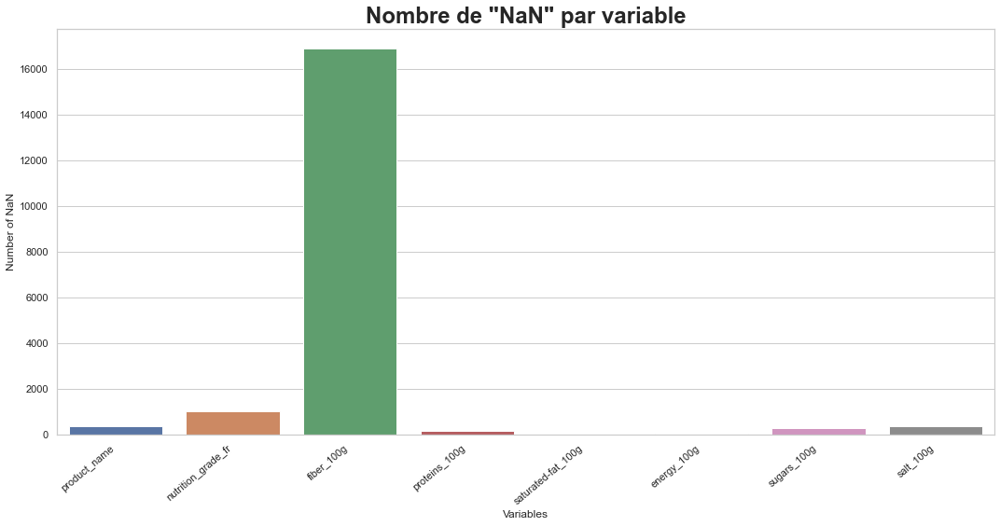

In [11]:
plt.figure(figsize=(18, 8))

nb_nan_df1 = nb_nan_df

sns.set_theme(style="whitegrid")
ax = sns.barplot(x="Variables", y="Number of NaN", data=nb_nan_df1)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
ax.set_title('Nombre de \"NaN\" par variable', fontdict= { 'fontsize': 24, 'fontweight':'bold'})

<AxesSubplot:>

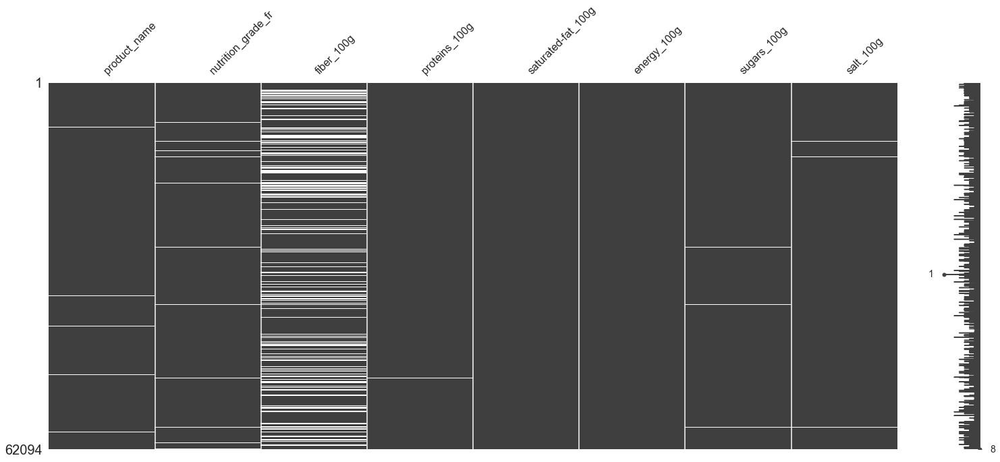

In [12]:
msno.matrix(data_fr)

In [13]:
# si besoins de 2 graphes
"""
nbr_col_nan_divide_by_2 = int(len(nb_nan_df)/2)

plt.figure(figsize=(18, 8))

nb_nan_df1 = nb_nan_df.iloc[:nbr_col_nan_divide_by_2]

sns.set_theme(style="whitegrid")
ax = sns.barplot(x="Variables", y="Number of NaN", data=nb_nan_df1)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
ax.set_title('Nombre de \"NaN\" par variable', fontdict= { 'fontsize': 24, 'fontweight':'bold'})

plt.figure(figsize=(18, 8))

nb_nan_df2 = nb_nan_df.iloc[nbr_col_nan_divide_by_2:]

sns.set_theme(style="whitegrid")
ax = sns.barplot(x="Variables", y="Number of NaN", data=nb_nan_df2)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
ax.set_title('Nombre de \"NaN\" par variable', fontdict= { 'fontsize': 24, 'fontweight':'bold'})
"""

'\nnbr_col_nan_divide_by_2 = int(len(nb_nan_df)/2)\n\nplt.figure(figsize=(18, 8))\n\nnb_nan_df1 = nb_nan_df.iloc[:nbr_col_nan_divide_by_2]\n\nsns.set_theme(style="whitegrid")\nax = sns.barplot(x="Variables", y="Number of NaN", data=nb_nan_df1)\nax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")\nax.set_title(\'Nombre de "NaN" par variable\', fontdict= { \'fontsize\': 24, \'fontweight\':\'bold\'})\n\nplt.figure(figsize=(18, 8))\n\nnb_nan_df2 = nb_nan_df.iloc[nbr_col_nan_divide_by_2:]\n\nsns.set_theme(style="whitegrid")\nax = sns.barplot(x="Variables", y="Number of NaN", data=nb_nan_df2)\nax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")\nax.set_title(\'Nombre de "NaN" par variable\', fontdict= { \'fontsize\': 24, \'fontweight\':\'bold\'})\n'

In [14]:
"""
col_to_impute_by_other = data_categorical.columns
col_to_impute_by_other = ["nutrition_grade_fr"]

col_to_impute_by_0 = [col for col in data_numerical.columns if "100g" in col]
# 2 variable speciale qui ne sont pas des proportions de nutriments mais des scores
col_to_impute_by_0.remove("nutrition-score-fr_100g")
col_to_impute_by_0.remove("nutrition-score-uk_100g")

col_to_impute_by_mean = [x for x in data_numerical.columns if x not in col_to_impute_by_0]
col_to_impute_by_mean = ["additives_n"]

#col_to_drop = ["","","","","","","",""]
# si col_to_drop => enlever "col_to_drop" aux autre col
"""

'\ncol_to_impute_by_other = data_categorical.columns\ncol_to_impute_by_other = ["nutrition_grade_fr"]\n\ncol_to_impute_by_0 = [col for col in data_numerical.columns if "100g" in col]\n# 2 variable speciale qui ne sont pas des proportions de nutriments mais des scores\ncol_to_impute_by_0.remove("nutrition-score-fr_100g")\ncol_to_impute_by_0.remove("nutrition-score-uk_100g")\n\ncol_to_impute_by_mean = [x for x in data_numerical.columns if x not in col_to_impute_by_0]\ncol_to_impute_by_mean = ["additives_n"]\n\n#col_to_drop = ["","","","","","","",""]\n# si col_to_drop => enlever "col_to_drop" aux autre col\n'

### Données numeriques

In [15]:
# les moyennes, médianes et quantiles des distributions sont calculées + écart-type
def tablo_descr_val_num(data_numerical):
    stats = {'variable':[], 
            'moyenne':[],
            'ecart-type':[],
            'max':[], 
            'quartile 1':[],
            'quartile 2':[],
            'quartile 3':[],
            'exemple':[]}

    for col in data_numerical.columns:
        stats["variable"].append(col)
        stats["moyenne"].append(data_numerical[col].mean())
        stats["ecart-type"].append(data_numerical[col].std())
        stats["max"].append(data_numerical[col].max())
        stats["quartile 1"].append(data_numerical[col].quantile(q=0.25))
        stats["quartile 2"].append(data_numerical[col].quantile(q=0.5))
        stats["quartile 3"].append(data_numerical[col].quantile(q=0.75))
        stats["exemple"].append(data_numerical[col].unique()[0])

    df = pd.DataFrame(stats) 
    return df

tablo_descr_val_num(data_numerical)

,variable,moyenne,ecart-type,max,quartile 1,quartile 2,quartile 3,exemple
0,fiber_100g,2.546880,4.627341,178.0,0.00,1.30,3.20,2.50000
1,proteins_100g,7.756687,7.864208,100.0,1.80,6.00,10.90,2.50000
2,saturated-fat_100g,5.427876,8.540288,210.0,0.30,2.00,7.40,12.50000
3,energy_100g,1180.911296,13094.851833,3251373.0,434.00,1040.00,1657.00,1883.00000
4,sugars_100g,13.345830,19.008510,104.0,1.00,4.00,17.50,57.50000
5,salt_100g,1.146800,4.162634,211.0,0.08,0.56,1.25,0.09652


**Box plot** des variables numeriques

In [16]:
#sns.set_theme(style="whitegrid")

for col in data_numerical.columns:
    print(col + " :")
    #ax = sns.boxplot(x=data_numerical[col])
    #plt.show()
    df = data_numerical[col]
    fig = px.box(df, y=col, log_y=True)
    fig.show()
    
    maxi = df.max()
    ele_max = data_fr[data_fr[col] == maxi]
    display(ele_max)

fiber_100g :


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
298897,Milka Schmunzelhase Alpenmilch 175G,e,178.0,6.3,18.0,2218.0,58.0,0.37


proteins_100g :


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
127525,Savarez - Jeu De Cordes,a,100.0,100.0,0.1,4.0,0.1,0.0
170118,Harry Potter & The Deathly Hallows Radcliffe /...,a,100.0,100.0,0.0,4.0,0.0,0.0
273543,Le Hobbit : La Bataille Des Cinq Armés - Versi...,a,100.0,100.0,0.0,4.0,0.0,0.0
283105,Eau,e,100.0,100.0,100.0,418.0,100.0,2.0
285429,Marshall - Major Noir,c,100.0,100.0,5.0,21.0,5.0,50.0


saturated-fat_100g :


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
245311,mini choux goût fromage de chèvre - poivre,e,0.0,0.0,210.0,18700.0,22.7,9.33


energy_100g :


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
212928,Pois cassés,b,15.4,22.7,0.2,3251373.0,2.5,0.01


sugars_100g :


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
202571,Sirop d'Agave brun bio,d,0.0,0.0,0.0,1760.0,104.0,0.14


salt_100g :


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
232239,Keeny Bio,e,0.741,6.3,3.33,1720.0,26.7,211.0


### Données incorrectes

En allant sur le site:\
https://world.openfoodfacts.org/cgi/search.pl \
En cherchant les aliments contenant de forte dose de sucre/sel on constate des produits ayant mal été decrits.

#### Erreur faible
Parfois l'erreur est negligable
<img src="confusion_faible.png" alt="confusion faible" width="700"/>

#### Erreur forte
Parfois l'erreur est grande
<img src="confusion_gmg.png" alt="confusion g/mg" width="700"/>

Souvent on retrouve une confusion entre g et mg.\
D'après https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/AI+Engineer/Project+3+-+Pr%C3%A9parez+des+donn%C3%A9es+pour+un+organisme+de+sant%C3%A9+publique/Open_Food_Facts_data-fields.txt \
La quantité est mesuré en g, mais on retrouve beaucoup de mesure correspondant au mg.

Besoins de protéines ? \
On retrouve aussi des articles non alimentaires contenant des nutriments (quelqu'un s'amuse à poster des fausses infos)\
<img src="pas_manger.png" alt="details" width="700"/>
D'autres exemples :\
https://world.openfoodfacts.org/product/0602508854224/lady-gaga-chromatica-k7-rose
<img src="album.jpg" alt="album" width="200"/>
https://world.openfoodfacts.org/product/3346029788657/carolin
<img src="carolin.jpg" alt="carolin" width="200"/>

Dans notre jeu de données on a, en generale 100g de protéines pour ces intrus.

In [17]:
ele_max = data_fr[data_fr["proteins_100g"] == 100]
display(ele_max)

,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
127525,Savarez - Jeu De Cordes,a,100.0,100.0,0.1,4.0,0.1,0.0
170118,Harry Potter & The Deathly Hallows Radcliffe /...,a,100.0,100.0,0.0,4.0,0.0,0.0
273543,Le Hobbit : La Bataille Des Cinq Armés - Versi...,a,100.0,100.0,0.0,4.0,0.0,0.0
283105,Eau,e,100.0,100.0,100.0,418.0,100.0,2.0
285429,Marshall - Major Noir,c,100.0,100.0,5.0,21.0,5.0,50.0


**En conclusion, les données présentes sur ce site contiennent un certain nombre de valeur incorrectes impactantes**

## II Nettoyage des données

<img src="wash.jpg" alt="nettoyage" width="700"/>

In [18]:
# graphes sur variables pertinentes
# elimine colonne 1 par 1 ?

### Nettoyage des valeurs manquantes

In [19]:
def cleaning(data):
    res= data
    
    return res

#### Imputation

On impute par 0 les valeurs manquantes correspondant à des proportions de nutriments (variables qui contiennent "100g").


https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html

In [20]:
#,inplace=True <== fait erreur
data_fr[col_to_impute_by_0] = data_fr[col_to_impute_by_0].fillna(0.0)
print("col impute by 0 DONE...")
data_fr[col_to_impute_by_other] = data_fr[col_to_impute_by_other].fillna("O")
print("col impute by \"O\" DONE...")
meanS = data_fr[col_to_impute_by_mean].mean()
data_fr[col_to_impute_by_mean] = data_fr[col_to_impute_by_mean].fillna(meanS)
print("col impute by mean DONE...")

data_numerical = data_fr.select_dtypes(include=np.number)
data_categorical = data_fr.select_dtypes(exclude=np.number)

NameError: name 'col_to_impute_by_0' is not defined

#### Eliminer des variables

### Nettoyage des doublons

on garde les premieres occurences des variables "code","url","product_name".\
La variable "product_name" contient des doublons.

In [ ]:
print("Nombre d'individus original: "+ str(data_fr.shape[0]))
data_fr.drop_duplicates(subset=['code'], keep = 'first', inplace=True)
print("Nombre d'individus en verifiant les doublons dans \'code\': "+ str(data_fr.shape[0]))
data_fr.drop_duplicates(subset=['url'], keep = 'first', inplace=True)
print("Nombre d'individus en verifiant les doublons dans \'url\': "+ str(data_fr.shape[0]))
data_fr.drop_duplicates(subset=['product_name'], keep = 'first', inplace=True)
print("Nombre d'individus en verifiant les doublons dans \'product_name\': "+ str(data_fr.shape[0]))

### Nettoyage des variables numeriques

### Nettoyage des variables categoriques

In [ ]:
print(data_categorical.columns)

In [ ]:
"""data_categorical["nutrition_grade_fr"].fillna("O", inplace =  True)"""

In [ ]:
data_fr["nutrition_grade_fr"].fillna("O", inplace =  True)

garde: code, nom_produit, nutrition_grade_fr

## III Analyse statistique multivariée / verification des hypothèses

### Regrouper les articles en classes (clustering)

une fonction

### ACP

In [ ]:
# choix du nombre de composantes à calculer
n_comp = 6

On garde les variables susceptibles d'avoir un impacte sur la santé

In [ ]:
# selection des colonnes à prendre en compte dans l'ACP
data_pca = data_fr[["calcium_100g","cholesterol_100g","fat_100g","sugars_100g","proteins_100g","energy_100g"]]
data_pca = data_fr[["vitamin-a_100g","vitamin-d_100g","vitamin-e_100g","vitamin-k_100g","vitamin-c_100g","vitamin-b1_100g",\
                "vitamin-b2_100g","vitamin-b6_100g","vitamin-b9_100g","vitamin-b12_100g","vitamin-pp_100g"]]



In [ ]:
data_pca

In [ ]:
# préparation des données pour l'ACP
data_pca = data_pca.fillna(data_pca.mean()) # Il est fréquent de remplacer les valeurs inconnues par la moyenne de la variable
X = data_pca.values
names = data_fr["product_name"] # ou data.index pour avoir les intitulés
names = data_fr["code"] # ou data.index pour avoir les intitulés
features = data_pca.columns

In [ ]:
X

In [ ]:
from sklearn import preprocessing
# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [ ]:
from sklearn import decomposition

# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)
pca.explained_variance_ratio_*100

In [ ]:
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(17,16))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
            
def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)
    
def plot_dendrogram(Z, names):
    plt.figure(figsize=(10,25))
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('distance')
    dendrogram(
        Z,
        labels = names,
        orientation = "left",
    )
    plt.show()

In [ ]:
# Eboulis des valeurs propres

    
display_scree_plot(pca)

In [ ]:
pca.components_

In [ ]:
# Cercle des corrélations
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))

vitamines B1 et B6 corrélées 

In [ ]:
# Projection des individus
X_projected = pca.transform(X_scaled)
display_factorial_planes(X_projected[0:10], n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(names))

plt.show()

### ACP 2


In [ ]:
# choix du nombre de composantes à calculer
n_comp = 6

On garde les variables susceptibles d'avoir un impacte sur la santé

In [ ]:
# selection des colonnes à prendre en compte dans l'ACP
data_pca = data_fr[["calcium_100g","cholesterol_100g","fat_100g","sugars_100g","proteins_100g","energy_100g"]]


In [ ]:
data_pca

In [ ]:
# préparation des données pour l'ACP
data_pca = data_pca.fillna(data_pca.mean()) # Il est fréquent de remplacer les valeurs inconnues par la moyenne de la variable
X = data_pca.values
names = data_fr["product_name"] # ou data.index pour avoir les intitulés
features = data_pca.columns

In [ ]:
X

In [ ]:
from sklearn import preprocessing
# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [ ]:
from sklearn import decomposition

# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)
pca.explained_variance_ratio_*100

In [ ]:
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(17,16))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
            
def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)
    
def plot_dendrogram(Z, names):
    plt.figure(figsize=(10,25))
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('distance')
    dendrogram(
        Z,
        labels = names,
        orientation = "left",
    )
    plt.show()

In [ ]:
# Eboulis des valeurs propres

    
display_scree_plot(pca)

In [ ]:
pca.components_

In [ ]:
# Cercle des corrélations
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))

vitamines B1 et B6 corrélées 

In [ ]:
# Projection des individus
X_projected = pca.transform(X_scaled)
display_factorial_planes(X_projected[0:10], n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(names))

plt.show()

### ACP 3

In [ ]:
# choix du nombre de composantes à calculer
n_comp = 6

On garde les variables susceptibles d'avoir un impacte sur la santé

In [ ]:
### selection des colonnes à prendre en compte dans l'ACP
data_pca = data_numerical[["sugars_100g", "sucrose_100g", "glucose_100g", "fructose_100g","energy_100g","fat_100g",
                           "saturated-fat_100g","monounsaturated-fat_100g", "polyunsaturated-fat_100g", "omega-3-fat_100g",
                           "omega-6-fat_100g","omega-9-fat_100g","trans-fat_100g","cholesterol_100g"]]


In [ ]:
data_pca

In [ ]:
# préparation des données pour l'ACP
data_pca = data_pca.fillna(data_pca.mean()) # Il est fréquent de remplacer les valeurs inconnues par la moyenne de la variable
X = data_pca.values
names = data_fr["product_name"] # ou data.index pour avoir les intitulés
features = data_pca.columns

In [ ]:
X

In [ ]:
from sklearn import preprocessing
# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [ ]:
from sklearn import decomposition

# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)
pca.explained_variance_ratio_*100

In [ ]:
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(17,16))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
            
def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)
    
def plot_dendrogram(Z, names):
    plt.figure(figsize=(10,25))
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('distance')
    dendrogram(
        Z,
        labels = names,
        orientation = "left",
    )
    plt.show()

In [ ]:
# Eboulis des valeurs propres

    
display_scree_plot(pca)

In [ ]:
pca.components_

In [ ]:
# Cercle des corrélations
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))

vitamines B1 et B6 corrélées 

In [ ]:
# Projection des individus
X_projected = pca.transform(X_scaled)
# avec les labels
#display_factorial_planes(X_projected[0:100], n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(names))
display_factorial_planes(X_projected[0:100], n_comp, pca, [(0,1),(2,3),(4,5)])

plt.show()

In [ ]:
"""col_to_impute_by_other = data_categorical.columns
col_to_impute_by_other = ["nutrition_grade_fr"]

col_to_impute_by_0 = [col for col in data_numerical.columns if "100g" in col]
# 2 variable speciale qui ne sont pas des proportions de nutriments mais des scores
col_to_impute_by_0.remove("nutrition-score-fr_100g")
col_to_impute_by_0.remove("nutrition-score-uk_100g")

col_to_impute_by_mean = [x for x in data_numerical.columns if x not in col_to_impute_by_0]
col_to_impute_by_mean = ["additives_n"]

#col_to_drop = ["","","","","","","",""]
# si col_to_drop => enlever "col_to_drop" aux autre col""""""

In [ ]:
"""#,inplace=True <== fait erreur
data_fr[col_to_impute_by_0] = data_fr[col_to_impute_by_0].fillna(0.0)
print("col impute by 0 DONE...")
data_fr[col_to_impute_by_other] = data_fr[col_to_impute_by_other].fillna("O")
print("col impute by \"O\" DONE...")
meanS = data_fr[col_to_impute_by_mean].mean()
data_fr[col_to_impute_by_mean] = data_fr[col_to_impute_by_mean].fillna(meanS)
print("col impute by mean DONE...")

data_numerical = data_fr.select_dtypes(include=np.number)
data_categorical = data_fr.select_dtypes(exclude=np.number)""""""

### ACP 4

In [21]:


df = data_fr
features = ["cholesterol_100g","fat_100g","sugars_100g"]
features = ["sugars_100g", "sucrose_100g", "glucose_100g", "fructose_100g","energy_100g","fat_100g",
            "saturated-fat_100g","monounsaturated-fat_100g", "polyunsaturated-fat_100g", "omega-3-fat_100g",
            "omega-6-fat_100g","omega-9-fat_100g","trans-fat_100g","cholesterol_100g"]
pca = PCA()
components = pca.fit_transform(df[features])

# df <= comp + score ================================
components_and_score = []
i=0
for score in pca.explained_variance_ratio_:
    components_and_score.append(np.concatenate((pca.components_[i], [score*100])))
    i += 1
components_and_score
features_and_variance = features.copy()
features_and_variance.append("% explained variance")
print(pd.DataFrame(components_and_score,columns=features_and_variance,index = ["PC "+str(i) for i in range(1,len(features)+1)]))
# ================================================


labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(2),
    color=df["nutrition_grade_fr"],hover_name=df["product_name"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

KeyError: "['polyunsaturated-fat_100g', 'fructose_100g', 'sucrose_100g', 'cholesterol_100g', 'monounsaturated-fat_100g', 'omega-3-fat_100g', 'omega-6-fat_100g', 'glucose_100g', 'omega-9-fat_100g', 'fat_100g', 'trans-fat_100g'] not in index"

In [23]:
col_bad_nutriment + col_good_nutriment

['saturated-fat_100g',
 'energy_100g',
 'sugars_100g',
 'salt_100g',
 'fiber_100g',
 'proteins_100g']

In [27]:
pca.fit_transform(df[features].dropna())

array([[ 6.86110461e+02,  4.46705768e+01,  3.90716730e+00,
         3.08588733e+00, -1.47422408e-01, -1.76212522e-01],
       [ 5.56110781e+02,  7.41546668e+01, -7.05006366e+00,
        -4.63362918e+00,  1.27410249e+00, -2.22721076e+00],
       [ 1.20911029e+03,  3.62587573e+01, -4.82571244e-01,
        -7.15124054e+00, -5.98311290e-01, -5.12453952e-01],
       ...,
       [ 4.46109504e+02, -1.15799354e+01, -5.30685958e-01,
        -6.23948348e+00, -1.77377071e+00,  1.79590786e+00],
       [ 1.20910970e+03, -1.08936915e+01,  6.89903914e+00,
        -1.26369384e+01, -4.58304215e+00,  5.57213698e+00],
       [-1.17589071e+03, -1.24398075e+01, -7.86951108e+00,
         5.13313295e+00, -5.21704120e-01, -9.48261539e-01]])

In [28]:
import plotly.express as px
from sklearn.decomposition import PCA

df = data_fr.dropna()
features = col_bad_nutriment + col_good_nutriment

pca = PCA()
components = pca.fit_transform(df[features])

# df <= comp + score ================================
components_and_score = []
i=0
for score in pca.explained_variance_ratio_:
    components_and_score.append(np.concatenate((pca.components_[i], [score*100])))
    i += 1
components_and_score
features_and_variance = features.copy()
features_and_variance.append("% explained variance")
print(pd.DataFrame(components_and_score,columns=features_and_variance,index = ["PC "+str(i) for i in range(1,len(features)+1)]))
# ================================================


labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(2),
    color=df["nutrition_grade_fr"],hover_name=df["product_name"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

      saturated-fat_100g   energy_100g  sugars_100g     salt_100g  fiber_100g  \
PC 1            0.000014  1.000000e+00     0.000017 -5.806892e-07    0.000007   
PC 2            0.058055 -1.632575e-05     0.992912 -1.705735e-02    0.007214   
PC 3            0.851524 -1.785333e-05     0.003359  3.173365e-02    0.078609   
PC 4            0.520043  5.134408e-06    -0.114341 -3.834664e-02   -0.190702   
PC 5            0.032872 -4.666499e-06    -0.030741 -8.860032e-02    0.975423   
PC 6           -0.003194  6.556908e-07     0.009774  9.946766e-01    0.077149   

      proteins_100g  % explained variance  
PC 1       0.000011             99.999784  
PC 2      -0.102040              0.000147  
PC 3       0.517406              0.000031  
PC 4      -0.823798              0.000021  
PC 5      -0.196660              0.000008  
PC 6      -0.067533              0.000007  


### ANOVA
analyse de variance. (comparer la distribution d'une variable en fonction d'une variable categorielle)\
est-ce que le nutri-score influx sur la variable "sugars_100g" ? (ou l'inverse)\
est-ce que la variable "sugars_100g" influx sur le nutri-score ?\
est-ce que le taux de sucre influx sur le nutri-score  ?

**Rappel : On considère que les valeurs manquante en contenance de sucre => 0 présence de sucre**

In [29]:
data_fr["sugars_100g"]

106       57.50
190       87.70
191       50.30
226       10.40
234        1.00
          ...  
320740    10.50
320741     1.00
320751     2.60
320757     3.89
320763     0.50
Name: sugars_100g, Length: 62094, dtype: float64

In [30]:
X = "nutrition_grade_fr" # qualitative
Y = "sugars_100g" # quantitative

# On ne garde que les dépenses
sous_echantillon = data_fr

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(sous_echantillon[X],sous_echantillon[Y])

nan

V-interclasse / V-total = 0.28\
Il y a une correlation entre le sucre et le nutri-score\
28 % de la variance du sucre est expliqué par son nutri score\
la variance de la quantité de sucre entre les differents (nutri-)score 

O = score non renseigné

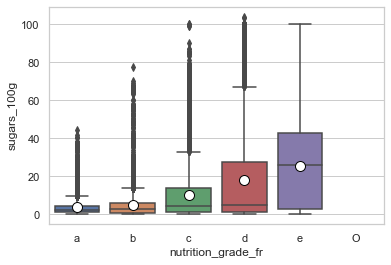

In [31]:
ax = sns.boxplot(x=X, y=Y, order=["a","b","c","d","e","O"], data=sous_echantillon, showmeans=True,
                meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"10"})

**valeurs max de chaques classes**

In [ ]:
df = {}
liste = ["product_name",X,Y]
for nutri_score in ["a","b","c","d","e","O"]:
    maxi = sous_echantillon[sous_echantillon[X] == nutri_score].sugars_100g.max()
    sous_echantillon_score = sous_echantillon[sous_echantillon[X] == nutri_score]
    ele_max = sous_echantillon_score[sous_echantillon_score[Y] == maxi]
    display(ele_max[liste])

